In [95]:
# Import dependencies
from matplotlib import pyplot as plt
from scipy.stats import linregress
import numpy as np
from sklearn import datasets
import pandas as pd
import seaborn as sns
import plotly.express as px
from pandas.plotting import scatter_matrix


In [96]:
# Import the data from the CSV file
mls_df = pd.read_csv("Data/mls_cleaned.csv")
mls_df.head()

,Property Type,Address,City,Zip,Bedrooms,Total Baths,Total Living Area SqFt,Acres,Year Built,List Date,Closing Date,List Price,Sold Price,Days Between,Profit
0,Single Family Residence,100 Wall Creek Drive,Rolesville,27571,5,3,2981,2,1999,2024-02-03,2024-06-14,669000,324999,132,-344001
1,Single Family Residence,12 Stonecliff Lane,Sanford,27332,4,3,2017,5,2023,2023-09-12,2024-05-10,319999,324999,241,5000
2,Single Family Residence,20 E Saint Andrews Drive,Zebulon,27597,3,3,2072,3,2023,2022-11-26,2024-05-15,366300,326930,536,-39370
3,Single Family Residence,2211 Wheeler Road,Raleigh,27607,5,8,9376,2,2022,2021-03-16,2022-02-23,1850000,3795000,344,1945000
4,Single Family Residence,7241 Burlington Road,Whitsett,27377,5,7,6983,8,1883,2021-09-27,2023-01-09,1300000,3240000,469,1940000


In [97]:
# Copy the data frame to a new data frame
sfr_df = mls_df.copy()

# Keep only the 'Single Family Residence' values in column 'Property Type'
sfr_df = sfr_df[sfr_df['Property Type'] == 'Single Family Residence']

# Drop the 'Property Type' column
sfr_df = sfr_df.drop(columns=['Property Type'])

#Drop the Address column
sfr_df = sfr_df.drop(columns=['Address'])

sfr_df.head()

,City,Zip,Bedrooms,Total Baths,Total Living Area SqFt,Acres,Year Built,List Date,Closing Date,List Price,Sold Price,Days Between,Profit
0,Rolesville,27571,5,3,2981,2,1999,2024-02-03,2024-06-14,669000,324999,132,-344001
1,Sanford,27332,4,3,2017,5,2023,2023-09-12,2024-05-10,319999,324999,241,5000
2,Zebulon,27597,3,3,2072,3,2023,2022-11-26,2024-05-15,366300,326930,536,-39370
3,Raleigh,27607,5,8,9376,2,2022,2021-03-16,2022-02-23,1850000,3795000,344,1945000
4,Whitsett,27377,5,7,6983,8,1883,2021-09-27,2023-01-09,1300000,3240000,469,1940000


In [98]:
sfr_df.describe()

,Zip,Bedrooms,Total Baths,Total Living Area SqFt,Acres,Year Built,List Price,Sold Price,Days Between,Profit
count,112708.000000,112708.000000,112708.000000,112708.000000,112708.000000,112708.000000,1.127080e+05,1.127080e+05,112708.000000,1.127080e+05
mean,27578.055089,3.521427,2.901746,2323.818700,2.340118,2000.213907,4.655198e+05,4.713704e+05,89.314547,5.850652e+03
std,421.144978,0.849585,1.024399,1002.107027,1.549277,134.711185,2.970567e+05,2.950654e+05,86.611390,3.663598e+04
min,17502.000000,0.000000,1.000000,1.000000,1.000000,0.000000,7.856000e+03,3.450000e+02,0.000000,-1.995000e+06
25%,27520.000000,3.000000,2.000000,1600.000000,1.000000,1988.000000,3.000000e+05,3.060000e+05,38.000000,-4.500000e+03
50%,27559.000000,3.000000,3.000000,2175.000000,2.000000,2006.000000,3.990000e+05,4.010345e+05,56.000000,0.000000e+00
75%,27610.000000,4.000000,3.000000,2824.000000,3.000000,2021.000000,5.499000e+05,5.550000e+05,109.000000,1.300000e+04
max,99999.000000,44.000000,34.000000,20283.000000,8.000000,20223.000000,7.000000e+06,6.625000e+06,1821.000000,1.945000e+06


In [99]:
sfr_df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 112708 entries, 0 to 141469
Data columns (total 13 columns):
 #   Column                  Non-Null Count   Dtype 
---  ------                  --------------   ----- 
 0   City                    112708 non-null  object
 1   Zip                     112708 non-null  int64 
 2   Bedrooms                112708 non-null  int64 
 3   Total Baths             112708 non-null  int64 
 4   Total Living Area SqFt  112708 non-null  int64 
 5   Acres                   112708 non-null  int64 
 6   Year Built              112708 non-null  int64 
 7   List Date               112708 non-null  object
 8   Closing Date            112708 non-null  object
 9   List Price              112708 non-null  int64 
 10  Sold Price              112708 non-null  int64 
 11  Days Between            112708 non-null  int64 
 12  Profit                  112708 non-null  int64 
dtypes: int64(10), object(3)
memory usage: 12.0+ MB


In [100]:
#Create a copy of the data frame and drop the non-numeric columns
sfr_nostr_df = sfr_df.copy()
sfr_nostr_df = sfr_nostr_df.drop(columns=['City'])
sfr_nostr_df = sfr_nostr_df.drop(columns=['List Date'])
sfr_nostr_df = sfr_nostr_df.drop(columns=['Closing Date'])

#Create a correlation matrix
corr_matrix = sfr_nostr_df.corr()
corr_matrix["Sold Price"].sort_values(ascending=False)

Sold Price                1.000000
List Price                0.992366
Total Living Area SqFt    0.770770
Total Baths               0.685095
Bedrooms                  0.451807
Days Between              0.131978
Acres                     0.131583
Year Built                0.038299
Profit                    0.007545
Zip                      -0.039739
Name: Sold Price, dtype: float64

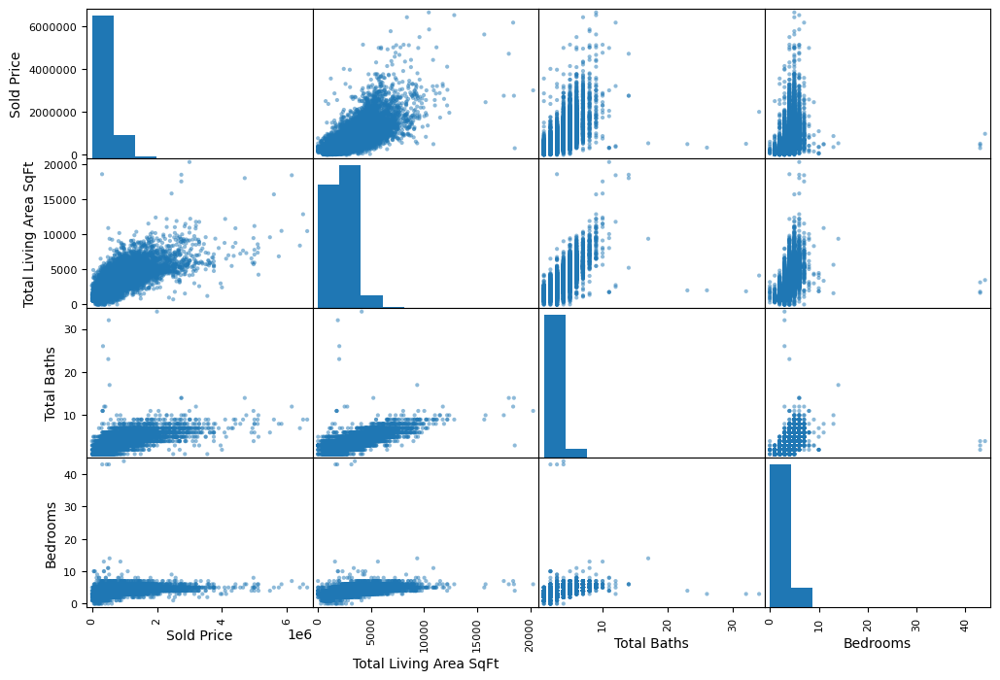

In [101]:
#Visualize the scatter matrix
scatter_columns = ["Sold Price", "Total Living Area SqFt", "Total Baths", "Bedrooms"]
scatter_matrix(sfr_nostr_df[scatter_columns], figsize=(12, 8))
#plt.savefig('matrix.png')

<Axes: xlabel='Total Living Area SqFt', ylabel='Sold Price'>

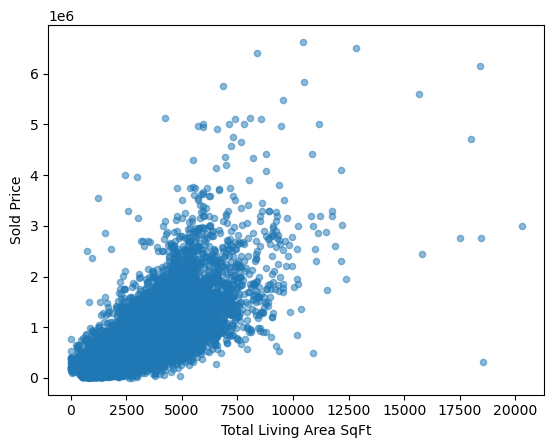

In [102]:
#Visualize the scatter plot for Total Living Area SqFt vs Sold Price
sfr_nostr_df.plot(kind="scatter", x="Total Living Area SqFt", y="Sold Price", alpha=0.5)
#plt.savefig('scatter.png')

In [103]:
#Create a new column for the price per square foot
sfr_nostr_df['Price per SqFt'] = sfr_nostr_df['Sold Price'] / sfr_nostr_df['Total Living Area SqFt']

#Create a correlation matrix to see what the correlation is for Price per SqFt
corr_matrix = sfr_nostr_df.corr()
corr_matrix["Sold Price"].sort_values(ascending=False)

Sold Price                1.000000
List Price                0.992366
Total Living Area SqFt    0.770770
Total Baths               0.685095
Bedrooms                  0.451807
Days Between              0.131978
Acres                     0.131583
Year Built                0.038299
Profit                    0.007545
Price per SqFt            0.007475
Zip                      -0.039739
Name: Sold Price, dtype: float64

In [112]:
#Check the orginal data frame to see how many cities are in the data
len(sfr_df['City'].value_counts())

373

In [113]:
#Cluster the cities into 3 groups
city_group = sfr_df['City'].value_counts()
city_group = city_group.reset_index()
city_group.columns = ['City', 'Count']
city_group['Cluster'] = pd.cut(city_group['Count'], bins=3, labels=['Small', 'Medium', 'Large'])
city_group

,City,Count,Cluster
0,Raleigh,17643,Large
1,Durham,11299,Medium
2,Clayton,6264,Medium
3,Fuquay Varina,5285,Small
4,Cary,5191,Small
...,...,...,...
368,Midway Park,1,Small
369,Rowland,1,Small
370,Edward,1,Small
371,Shannon,1,Small


In [115]:
#Create a variable for the top 10 cities with the highest average sold price
top10 = sfr_df.groupby('City')['Sold Price'].mean().nlargest(373).reset_index()

#Plot the top 10 cities with the highest average sold price
fig = px.bar(top10, x='City', y='Sold Price',color='City', template='plotly',
             title='Cities with Highest Avg. Sold Price') 
fig.update_traces(textposition='outside')
fig.show()

In [116]:
top10 = sfr_df.groupby('City')['Total Baths'].mean().nlargest(10).reset_index()

fig = px.bar(top10, x='City', y='Total Baths',color='Total Baths', template='plotly', 
             title='Top 10 Cities with the Most Avg Total Baths')
fig.update_traces(texttemplate='%{y:.}', textposition='outside')
fig.show()

In [107]:
df_mean = sfr_df.groupby('Sold Price')['Total Living Area SqFt'].mean().reset_index()

fig = px.scatter(df_mean, x='Sold Price', y='Total Living Area SqFt', trendline='ols', 
                 labels={'Sold Price':'Sold Price', 'Total Living Area SqFt':'Mean House Size'})
fig.update_layout(title='Distribution of Mean House Size by Sold Price')
fig.show()

In [108]:
fig = px.scatter(sfr_df, x='Total Living Area SqFt', y='Sold Price', color='Bedrooms', size='Total Baths',trendline='ols')
fig.update_layout(title='House Size vs Sold Price',
                  xaxis_title='House Size',
                  yaxis_title='Sold Price')
fig.show()

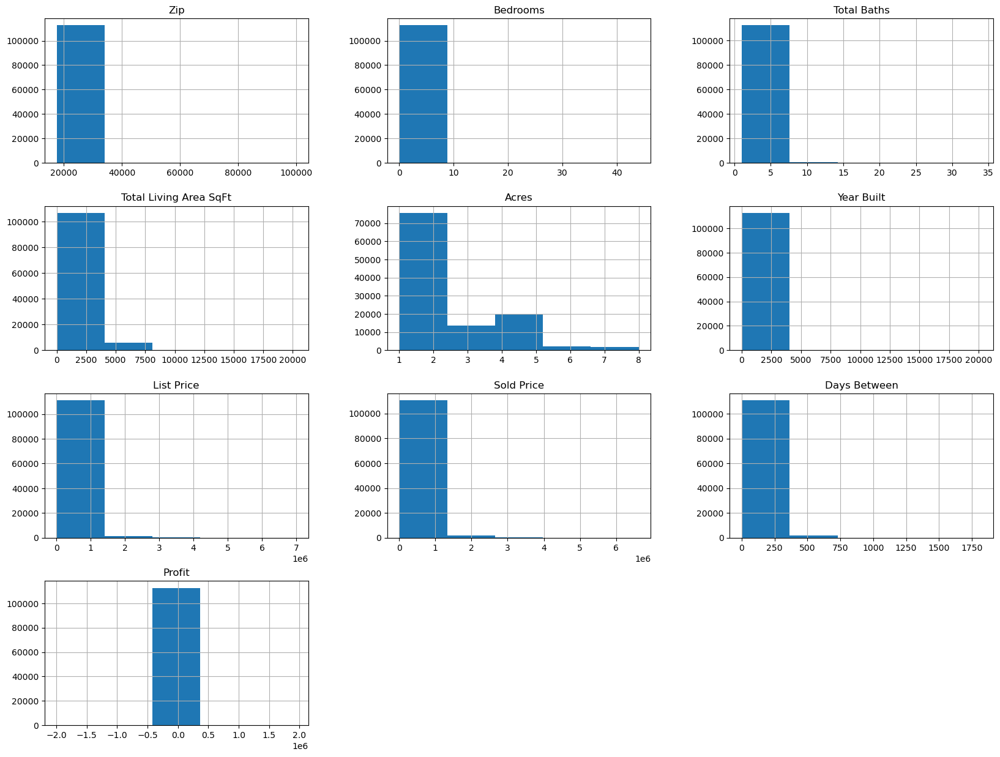

In [109]:
sfr_df.hist(bins=5, figsize=(20,15))
#plt.savefig("attribute_histogram_plots")
plt.show()